# Flow past a cylinder example

This notebook shows how to find the optimal placement of sensors and how to predict the velocity field using few measurements.

The dataset employed was generated using Immersed Boundary Projection Method (IBPM) Code: 
https://github.com/cwrowley/ibpm

In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

# Load the data matrix X and the test vector x_test
X = np.load('../data/flow_cylinder/X.npy')
x_test = np.load('../data/flow_cylinder/x_test.npy')

n_features = 2 # the data matrix is made up of u and v for 151 snapshots
n_points = X.shape[0] // 2
n = X.shape[0]
m = X.shape[1]

# the mesh is 199x449 cells
ndx = 199
ndy = 449

xdim = np.arange(0, ndx)
ydim = np.arange(0, ndy)

xgrid, ygrid = np.meshgrid(xdim, ydim)
xgrid_t = np.transpose(xgrid)
ygrid_t = np.transpose(ygrid)

ugrid_t = np.transpose(X[0*n_points:(0+1)*n_points, 0].reshape(ndy, ndx))
vgrid_t = np.transpose(X[1*n_points:(1+1)*n_points, 0].reshape(ndy, ndx))

mag = np.sqrt(ugrid_t**2 + vgrid_t**2)
lw = 2*mag/mag.max()

fig, ax = plt.subplots()
ax.axis('equal')    

def animate(i):
    ax.cla()
    ugrid_t = np.transpose(X[0*n_points:(0+1)*n_points, i].reshape(ndy, ndx))
    vgrid_t = np.transpose(X[1*n_points:(1+1)*n_points, i].reshape(ndy, ndx))
        
    mag = np.sqrt(ugrid_t**2 + vgrid_t**2)
    lw = 2*mag/mag.max()
    strm = ax.streamplot(ygrid_t, xgrid_t, ugrid_t, vgrid_t, color=mag, linewidth=lw, cmap='turbo')
    return strm
    
    
anim = animation.FuncAnimation(fig, animate, frames=100, interval=200, blit=False)
plt.close()

In [3]:
HTML(anim.to_jshtml())

Scaling the matrix...
Computing the SVD...


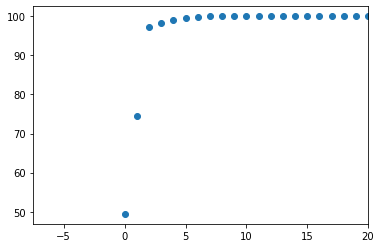

In [4]:
from sparse_sensing import SPR
spr = SPR(X, 2)

X0 = spr.scale_data()
U, exp_variance = spr.decomposition(X0)

modes = np.arange(X.shape[1])
plt.scatter(modes, exp_variance)
plt.xlim(right=20)
plt.show()

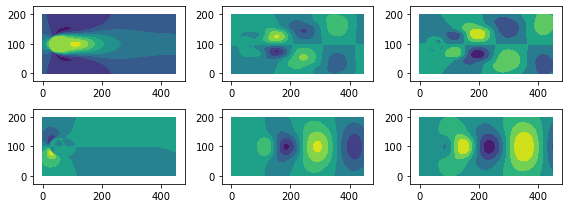

In [5]:
nrows = 2
ncols = 3
fig, axs = plt.subplots(nrows, ncols, figsize=(8,3))
for i in range(nrows):
    for j in range(ncols):
        u_t = np.transpose(U[i*n_points:(i+1)*n_points, j].reshape(ndy, ndx))
        axs[i,j].contourf(ygrid_t, xgrid_t, u_t)
        axs[i,j].axis('equal')
        axs[i,j].set_ylim(0, 200)
        
fig.tight_layout()
plt.show()

In [6]:
C = spr.optimal_placement(select_modes='number', n_modes=151)

Scaling the matrix...
Computing the SVD...
Computing the QRCP and calculating C...


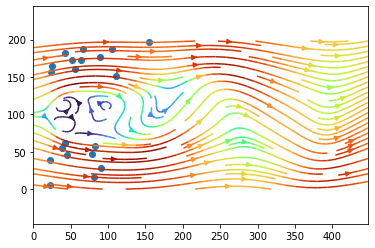

In [7]:
xcoord = np.zeros((U.shape[0],))
ycoord = np.zeros((U.shape[0],))

for i in range(2):
    xcoord[i*n_points:(i+1)*n_points] = xgrid.flatten()
    ycoord[i*n_points:(i+1)*n_points] = ygrid.flatten()

s=20
C_red = C[:s,:] 

xcoord_sensor = C_red @ xcoord
ycoord_sensor = C_red @ ycoord

fig, ax = plt.subplots()
ax.axis('equal')    
strm = ax.streamplot(ygrid_t, xgrid_t, ugrid_t, vgrid_t, color=mag, cmap='turbo')
ax.scatter(ycoord_sensor, xcoord_sensor)

plt.show()

Scaling the matrix...
Computing the SVD...
(178702,)


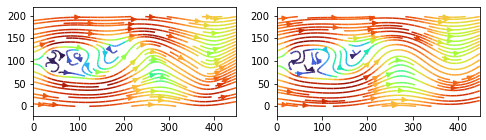

In [8]:
y = np.zeros((s,2))
y[:,0] = C_red @ x_test
for i in range(s):
    y[i,1] = np.argmax(C_red[i,:])//n_points

x_rec = spr.fit_predict(C_red, y, select_modes='number', n_modes=4)
print(x_rec.shape)

ugrid_t = np.transpose(x_test[0*n_points:(0+1)*n_points].reshape(ndy, ndx))
vgrid_t = np.transpose(x_test[1*n_points:(1+1)*n_points].reshape(ndy, ndx))
mag = np.sqrt(ugrid_t**2 + vgrid_t**2)

ugrid_rec_t = np.transpose(x_rec[0*n_points:(0+1)*n_points].reshape(ndy, ndx))
vgrid_rec_t = np.transpose(x_rec[1*n_points:(1+1)*n_points].reshape(ndy, ndx))
mag_rec = np.sqrt(ugrid_rec_t**2 + vgrid_rec_t**2)

fig, axs = plt.subplots(1,2, figsize=(8,2))
axs[0].streamplot(ygrid_t, xgrid_t, ugrid_t, vgrid_t, color=mag, cmap='turbo')
axs[1].streamplot(ygrid_t, xgrid_t, ugrid_rec_t, vgrid_rec_t, color=mag_rec, cmap='turbo')

for i in range(2):
    axs[i].axis('equal')  

plt.show()

(178702,)


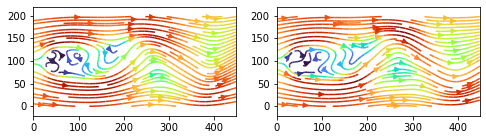

In [14]:
y_n = np.copy(y)
np.random.seed(42)
y_n[:,0] = y[:,0] + 0.01*np.random.normal(size=(s,))/x_test.max()

x_rec = spr.predict(y_n)
print(x_rec.shape)
ugrid_t = np.transpose(x_test[0*n_points:(0+1)*n_points].reshape(ndy, ndx))
vgrid_t = np.transpose(x_test[1*n_points:(1+1)*n_points].reshape(ndy, ndx))
mag = np.sqrt(ugrid_t**2 + vgrid_t**2)

ugrid_rec_t = np.transpose(x_rec[0*n_points:(0+1)*n_points].reshape(ndy, ndx))
vgrid_rec_t = np.transpose(x_rec[1*n_points:(1+1)*n_points].reshape(ndy, ndx))
mag_rec = np.sqrt(ugrid_rec_t**2 + vgrid_rec_t**2)

fig, axs = plt.subplots(1,2, figsize=(8,2))
axs[0].streamplot(ygrid_t, xgrid_t, ugrid_t, vgrid_t, color=mag, cmap='turbo')
axs[1].streamplot(ygrid_t, xgrid_t, ugrid_rec_t, vgrid_rec_t, color=mag_rec, cmap='turbo')

for i in range(2):
    axs[i].axis('equal')  

plt.show()